In [1]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

import matplotlib.patches as patches
from mpl_toolkits.mplot3d import Axes3D
import xarray as xr
from scipy import ndimage

import plotly.graph_objects as go
%matplotlib widget
import matplotlib.colors as mcolors
import warnings
from matplotlib.patches import Rectangle

from scipy.interpolate import griddata
from scipy.stats import norm
from scipy.optimize import curve_fit
import time
import pandas as pd

warnings.filterwarnings("ignore", category=RuntimeWarning, message="divide by zero encountered in log10")
warnings.filterwarnings("ignore", category=RuntimeWarning, message="invalid value encountered in log10")
from matplotlib.path import Path

In [2]:
def _points_in_any_contour(cs, points, level_index=0, chunk=50000):
    # Collect polygons at the level
    polys = []
    if hasattr(cs, "allsegs") and len(cs.allsegs) > level_index:
        for verts in cs.allsegs[level_index]:
            if len(verts) >= 3:
                polys.append(Path(verts))
    elif hasattr(cs, "collections") and len(cs.collections) > level_index:
        for p in cs.collections[level_index].get_paths():
            v = getattr(p, "vertices", None)
            if v is not None and len(v) >= 3:
                polys.append(Path(v))

    if not polys:
        # No geometry at this level (threshold too high / sparse data)
        return np.zeros(len(points), dtype=bool)

    inside = np.zeros(len(points), dtype=bool)
    # Chunk to keep memory reasonable when points is large
    for start in range(0, len(points), chunk):
        sl = slice(start, start+chunk)
        P = points[sl]
        # OR across all polygons
        mask = np.zeros(len(P), dtype=bool)
        for poly in polys:
            mask |= poly.contains_points(P)
        inside[sl] = mask
    return inside

In [6]:
def VoxInt_103_105(filename = '\\8.28.24_V1', sample = 'Ru1_Pristine', threshold = 80, l_min = 1.1, l_max = 1.87, cut_size = 0.05, bin_size = 20, plot = False, print3d = False, save2D = False):
    
    ########### Reading in Datafiles #######################
    %matplotlib inline
    path = r'D:\CTR_MyDrive\Extracted_3D'
    qx = np.loadtxt(path + '\\' + sample + '\\103-105' + filename + '_Qx_103_105.txt')
    qy = np.loadtxt(path + '\\' + sample + '\\103-105' + filename + '_Qy_103_105.txt')
    qz = np.loadtxt(path + '\\' + sample + '\\103-105' + filename+ '_l_103_105.txt')
    # SF = np.loadtxt(path + '\\' + sample + '\\100-103' + filename+ '_I_100_103.txt') #Uncomment if you want to look at Intensity
    SF = np.loadtxt(path + '\\' + sample + '\\103-105' + filename + '_SF_103_105.txt')
    
    #### Main Cropping of Data ###########
    
    if sample == 'Ru1_Pristine':
        qx_min = 1.6
        qx_max = 1.9
        qy_min = 1.7
        qy_max = 2.2
    
    if sample == 'Ru1_DMB':
        qx_min = 0.2
        qx_max = 0.5
        qy_min = 2.6
        qy_max = 2.7
    
    qz_min = l_min
    qz_max = l_max

    qx_mask = []
    qy_mask = []
    qz_mask = []
    SF_mask = []

    for x, y, z, sf in zip(qx, qy, qz, SF):
        if x <= qx_max and x >= qx_min:
            if y <= qy_max and y >= qy_min:
                if z <= qz_max and z >= qz_min:
                    qx_mask.append(x)
                    qy_mask.append(y)
                    qz_mask.append(z)
                    SF_mask.append(sf)
                    
    1. ########## Moving to Voxel Space ###############
    voxel_size = 0.005
    qx_edges = np.arange(qx_min, qx_max + voxel_size, voxel_size)
    qy_edges = np.arange(qy_min, qy_max + voxel_size, voxel_size)
    qz_edges = np.arange(qz_min, qz_max + voxel_size, voxel_size)

    # Voxelate using histogram and normalize to number of counts
    counts, _ = np.histogramdd((qx_mask, qy_mask, qz_mask), bins=(qx_edges, qy_edges, qz_edges))

    # Compute the histogram with weights (intensity) to get the summed intensities in each voxel
    summed_SF, _ = np.histogramdd((qx_mask, qy_mask, qz_mask), bins=(qx_edges, qy_edges, qz_edges), density = False, weights=SF_mask)

    # Normalize by the number of points to get the average intensity per voxel
    average_SF = np.divide(summed_SF, counts, where=counts!=0)
    
    # Define voxel centers
    qx_centers = (qx_edges[:-1] + qx_edges[1:]) / 2
    qy_centers = (qy_edges[:-1] + qy_edges[1:]) / 2
    qz_centers = (qz_edges[:-1] + qz_edges[1:]) / 2

    # Create a meshgrid for voxel centers
    X, Y, Z = np.meshgrid(qx_centers, qy_centers, qz_centers, indexing='ij')

    2. ############### Getting Rid of Zero Count Voxels #################
    
    nonzero = counts>0
    
    # Voxelated Data Arrays
    reduced_SF = average_SF[nonzero]
    X = X[nonzero]
    Y = Y[nonzero]
    Z = Z[nonzero] 
    
    3. ############## Making Slices in L #################
    # Define the bin edges for l values
    z_bins = np.arange(l_min, l_max, cut_size) 

    # Initialize lists to store results
    x_stack = []
    y_stack = []
    z_stack = []
    sf_stack = []
    
    z_avg = []

    for i in range(len(z_bins) - 1):
        z_min = z_bins[i]
        z_max = z_bins[i + 1]

        # Initialize lists to store results
        x_bin = []
        y_bin = []
        z_bin = []
        sf_bin = []

        # Find all values inside of bin
        for i, (xx, yy, zz, sf) in enumerate(zip(X,Y,Z, reduced_SF)):
            if (zz >= z_min) & (zz < z_max):
                x_bin.append(xx)
                y_bin.append(yy)
                z_bin.append(zz)
                sf_bin.append(sf)

        # Flatten the bin by averaging z
        if len(z_bin) > 0:
            avg_z = np.around(np.nanmean(z_bin), 5)
        else:
            print("Skipping z_bin processing as it is empty.")
            avg_z = np.nan  # Set it to NaN or any other default value

        avg_z = np.around(np.nanmean(z_bin),5) #Average all z values
        z_avg.append(avg_z) #Save value

        z_full = np.full(len(x_bin), avg_z) #Create full array of avgerage z to match length of coordinates for bin

        #Move all values to stack arrays
        x_stack.extend(x_bin)
        y_stack.extend(y_bin)
        z_stack.extend(z_full)
        sf_stack.extend(sf_bin)
        
    4. ################ Integration of Arrays over L ##############
    #Initialization of Arrays      
    ROI_x = []
    ROI_y = []
    ROI_z = []
    ROI_sf = []

    sf_slab_total = []
    sf_slab_points = []
    sf_slab_norm = []
    
    full_bin_range = []

    for index, i in enumerate(z_avg):
        
        full_bin_range.append(i)

        plt.clf()

        ################ Find Correct Stack for Bin ##############
        
        # Reinitialize these arrays for each z_bin iteration
        x_slab = []
        y_slab = []
        z_slab = []
        sf_slab = []

        for x, y, z, sf in zip(x_stack, y_stack, z_stack, sf_stack):
            if z == np.round(i,5):
                x_slab.append(x)
                y_slab.append(y)
                z_slab.append(z)
                sf_slab.append(sf)

        x_flat = np.array(x_slab).flatten()
        y_flat = np.array(y_slab).flatten()
        z_flat = np.array(z_slab).flatten()
        sf_flat = np.array(sf_slab).flatten()

        ############### Remove anything that holds a non real sf value #############
        nan_mask = ~np.isnan(sf_flat)

        x_thresh = x_flat[nan_mask]
        y_thresh = y_flat[nan_mask]
        z_thresh = z_flat[nan_mask]
        sf_thresh = sf_flat[nan_mask]
        
        max_index = np.argmax(sf_thresh)

        ############# Defining integration BKG Integration Region ##########
        bkg_x_cen = x_thresh[max_index]
        bkg_y_cen = y_thresh[max_index]+0.08 
        
        if sample == 'Ru1_Pristine':
            offset = +0.00
            bkg_x_cen = bkg_x_cen+offset
            bkg_y_cen = bkg_y_cen+offset

        bkg_x_tol = 0.035
        bkg_y_tol = 0.03

        bkg_x = []
        bkg_y = []
        bkg_z = []
        bkg_sf = []

        for a, b, c, ssf in zip(x_thresh, y_thresh, z_thresh, sf_thresh):
            if a <= bkg_x_cen + bkg_x_tol and a >= bkg_x_cen - bkg_x_tol and b <= bkg_y_cen + bkg_y_tol and b >= bkg_y_cen - bkg_y_tol:
                bkg_x.append(a)
                bkg_y.append(b)
                bkg_z.append(c)
                bkg_sf.append(ssf)

        counts, bin_edges = np.histogram(bkg_sf, bins=bin_size, density = False)

    
        ########### Find the average bkg by fitting with Gaussian #####################
        
        bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
        # Step 2: Fit a Gaussian to the 
        mu, std = norm.fit(bkg_sf)
        
        bkg_round = np.round(mu, 5)
        
        ############ Defining ROD Integration Region ####################
        rod_x_cen = x_thresh[max_index]
        rod_y_cen = y_thresh[max_index]
        
        if sample == 'Ru1_Pristine':
            offset = +0.0
            rod_x_cen = rod_x_cen+offset
            rod_y_cen = rod_y_cen+offset
        
        rod_x_tol = 0.035
        rod_y_tol = 0.03
        
        rod_x = []
        rod_y = []
        rod_z = []
        rod_sf = []
        
        for xx, yy, zz, ssf in zip(x_thresh, y_thresh, z_thresh, sf_thresh):
             if xx <= rod_x_cen + rod_x_tol and xx >= rod_x_cen - rod_x_tol and yy <= rod_y_cen + rod_y_tol and yy >= rod_y_cen - rod_y_tol:
                    rod_x.append(xx)
                    rod_y.append(yy)
                    rod_z.append(zz)
                    rod_sf.append(ssf) #Perform Background Sub on Val
                   
        # print(np.sum(ssf))
                    
        ################## Subtraction BKG from Rod #######################
        # rod_bkgsub = [rod - bkg_round for rod in rod_sf]
                    
        ####################  Create contour of the ROI ###################
            
        #################### ROI via contour + background subtraction ####################

        # Convert once
        rod_sf = np.asarray(rod_sf, float)
        rod_x  = np.asarray(rod_x,  float)
        rod_y  = np.asarray(rod_y,  float)
        rod_z  = np.asarray(rod_z,  float)
        
        # If this slab has no points, skip it cleanly
        if rod_x.size == 0:
            plt.close('all')
            continue
        
        # Small padding to avoid identical min/max ranges blowing up mgrid
        _eps = 1e-9
        x0, x1 = np.min(rod_x), np.max(rod_x)
        y0, y1 = np.min(rod_y), np.max(rod_y)
        
        # Grid for contouring
        grid_rod_x, grid_rod_y = np.mgrid[x0:x1:500j, y0:y1:500j]
        
        # Interpolate to grid (nearest avoids holes at low density)
        grid_rod_sf = griddata((rod_x, rod_y), rod_sf, (grid_rod_x, grid_rod_y), method='nearest')
        
        # Contour at the chosen percentile (same behavior as before)
        c_levels = np.nanpercentile(grid_rod_sf, threshold)
        cs = plt.contour(grid_rod_x, grid_rod_y, grid_rod_sf, levels=[c_levels],
                         cmap='gist_ncar', linewidths=2.5)
        
        # Points to test and “all islands” inclusion
        points = np.column_stack((rod_x, rod_y))
        inside = _points_in_any_contour(cs, points, level_index=0)
        
        # Filter to inside the ROI
        rod_sf_inside_contour = rod_sf[inside]
        rod_x_inside_contour  = rod_x[inside]
        rod_y_inside_contour  = rod_y[inside]
        rod_z_inside_contour  = rod_z[inside]
        
        # Background subtraction (vectorized)
        rod_bkgsub = rod_sf_inside_contour - bkg_round
        
        plt.close('all')
        
        # Accumulate results
        ROI_x.extend(rod_x_inside_contour)
        ROI_y.extend(rod_y_inside_contour)
        ROI_z.extend(rod_z_inside_contour)
        ROI_sf.extend(rod_bkgsub.tolist())
        
        sf_total = float(np.sum(rod_bkgsub))
        sf_slab_total.append(sf_total)
        sf_slab_points.append(len(rod_sf))           # keep your original definition of “points”
        sf_slab_norm.append(sf_total / len(rod_sf))  # same normalization as before


        ######## Plotting Contour for each slab ################
        
        if plot == True:

            fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(15, 4))
            fig.suptitle('Index: ' + str(index))

            # First subplot: Histogram with Gaussian fit
            ax1.scatter(x_thresh, y_thresh, c=np.log10(sf_thresh), cmap='jet', marker='s')
            ax1.set_xlim(right = x_thresh[max_index]+0.1, left = x_thresh[max_index]-0.1)
            ax1.set_ylim(top = y_thresh[max_index]+0.07, bottom = y_thresh[max_index]-0.07)
            ax1.set_title('Voxelated Slab L = ' + str(i))
            ax1.set_xlabel('x')
            ax1.set_ylabel('y')

#             # Second subplot: ROI Plot
            ax2.contour(grid_rod_x, grid_rod_y, grid_rod_sf, levels= [c_levels], cmap='gist_ncar', linewidths = 2.5)
            ax2.scatter(x_thresh, y_thresh, c=np.log10(sf_thresh), cmap='jet', marker='s', alpha = 0.4)
        
            bkg_box = patches.Rectangle(
                (bkg_x_cen - bkg_x_tol, bkg_y_cen - bkg_y_tol),  # Bottom left corner (x, y)
                2 * bkg_x_tol,  # Width of the rectangle
                2 * bkg_y_tol,  # Height of the rectangle
                linewidth=3,
                edgecolor='black',
                facecolor='none',
                linestyle ='-'
            )
    
            
            rod_box = patches.Rectangle(
                (rod_x_cen - rod_x_tol, rod_y_cen - rod_y_tol),  # Bottom left corner (x, y)
                2 * rod_x_tol,  # Width of the rectangle
                2 * rod_y_tol,  # Height of the rectangle
                linewidth=3,
                edgecolor='black',
                facecolor='none',
                linestyle ='-'
            )

            # Add the rectangle patch to the plot
            ax2.add_patch(bkg_box)
            ax2.add_patch(rod_box)
            ax2.set_xlim(right = x_thresh[max_index]+0.075, left = x_thresh[max_index]-0.075)
            ax2.set_ylim(top = y_thresh[max_index]+0.1, bottom = y_thresh[max_index]-0.05)
            ax2.set_title('Contour with Background Region Defined')
            ax2.set_xlabel('x')
            ax2.set_ylabel('y')
            # ax2.legend()

            #Third Scatter Plot of ROI Region
            ax3.scatter(rod_x_inside_contour, rod_y_inside_contour, c=np.log10(rod_bkgsub), cmap='jet', marker='s')
            ax3.set_xlim(right = x_thresh[max_index]+0.1, left = x_thresh[max_index]-0.1)
            ax3.set_ylim(top = y_thresh[max_index]+0.075, bottom = y_thresh[max_index]-0.075)
            ax3.set_title('Voxelated Slab L = ' + str(i))
            ax3.set_xlabel('x')
            ax3.set_ylabel('y')

            # Fourth Histogram with Gaussian fit to background
            plt.hist(bkg_sf, bins=bin_size, density=False, alpha=0.6, color='g', label='Histogram')
            x = np.linspace(bin_edges[0], bin_edges[-1], 100)
            p = norm.pdf(x, mu, std) * sum(counts) * (bin_centers[1] - bin_centers[0]) # scale to match the histogram
            plt.plot(x, p, 'k', linewidth=2, label=f'Gaussian fit: $\mu={mu:.2f}$, $\sigma={std:.2f}$')
            ax4.set_title('Average Background = ' + str(bkg_round))
            ax4.set_xlabel('Intensity')
            ax4.set_ylabel('Frequency')

            # Adjust layout
            plt.tight_layout()
            plt.show()
            
    if print3d == True:
       # Plot the stacked voxelated Data
        plt.close('all')
        fig = plt.figure('', figsize = (6,6))
        fig.suptitle('3D Rod for the 10L Plane (L: ' +  str(l_min) + '-' + str(l_max) + ')', fontsize = 15)
        
        ax = fig.add_subplot(111, projection='3d')
        sc = ax.scatter(ROI_x, ROI_y, ROI_z, c=np.log10(ROI_sf), cmap='jet', marker='s')
        # ax.set_xlabel('q$_x$', fontsize = 15)
        # ax.set_ylabel('q$_y$', fontsize = 15)
        ax.set_zlabel('L', fontsize = 15)
        cbar = plt.colorbar(sc, ax=ax)
        cbar.set_label('SF', fontsize = 12)
        ax.view_init(elev = 20, azim = 30)

        x_min =x_thresh[max_index]-0.1
        x_max = x_thresh[max_index]+0.1
        y_min = x_thresh[max_index]-0.1
        y_max = x_thresh[max_index]+0.1
        z_min = l_min
        z_max = l_max

        # Set the x, y, and z limits
        ax.set_zlim([z_min, z_max])  # Replace z_min and z_max with your desired limits

        ax.view_init(elev=20, azim=30)

        plt.tight_layout()
        plt.show() 
    
    if save2D == True:
        path_2d = r'D:\CTR_MyDrive\Extracted_2D'
        np.savetxt(path_2d + '\\' + sample + '\\103-105' + filename + '_' + str(l_min) + '_' + str(l_max) + '_L', full_bin_range)
        np.savetxt(path_2d + '\\' + sample + '\\103-105' + filename + '_' + str(l_min) + '_' + str(l_max) + '_SF', sf_slab_total)
        np.savetxt(path_2d + '\\' + sample + '\\103-105' + filename + '_' + str(l_min) + '_' + str(l_max) + '_SFnorm', sf_slab_norm)

        print('Congrats! You saved the 2D CTR in RLU')
        
    return full_bin_range, sf_slab_total, sf_slab_norm

## Ru1_Pristine

### 103-104

In [7]:
Ru1_P_25C_z_104, Ru1_P_25C_SF_104, Ru1_P_25C_SF_norm_104 = VoxInt_103_105(filename = '/10.15.2025_Ru1_Pristine_25C', sample = 'Ru1_Pristine', threshold = 90, l_min = 3.1, l_max = 3.9, cut_size = 0.01, bin_size = 20, plot = False, print3d = False, save2D = True)

Congrats! You saved the 2D CTR in RLU


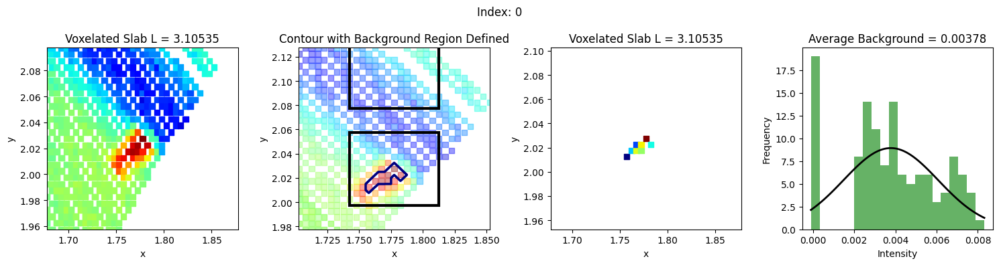

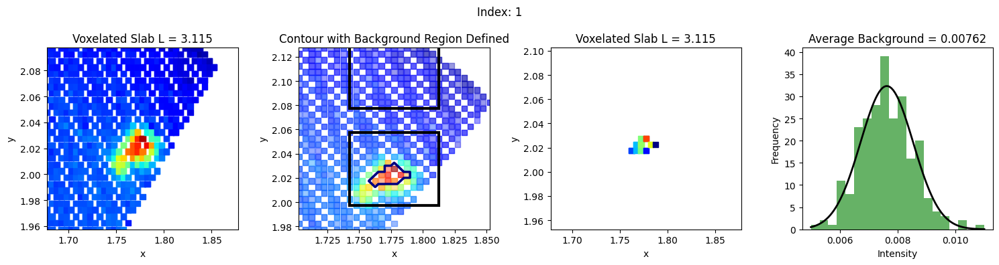

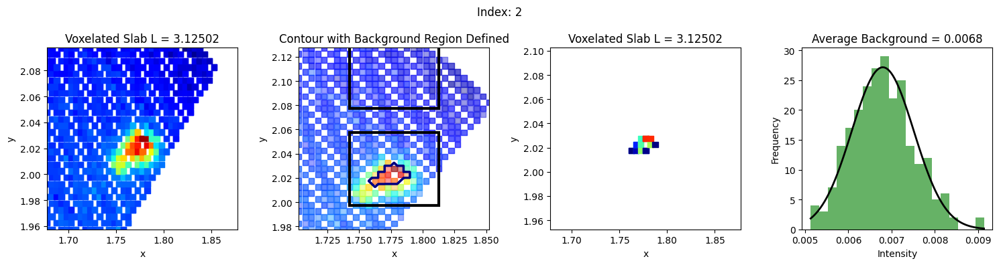

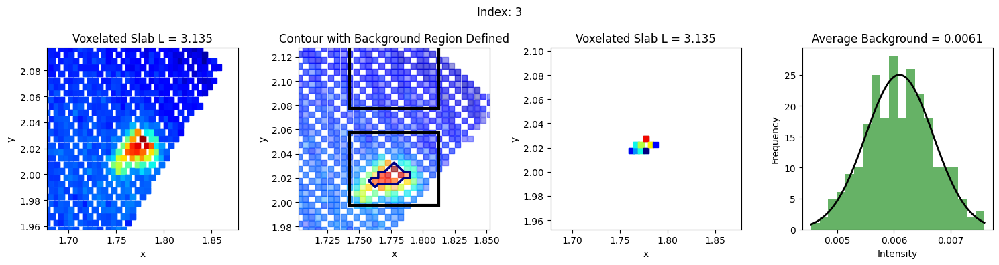

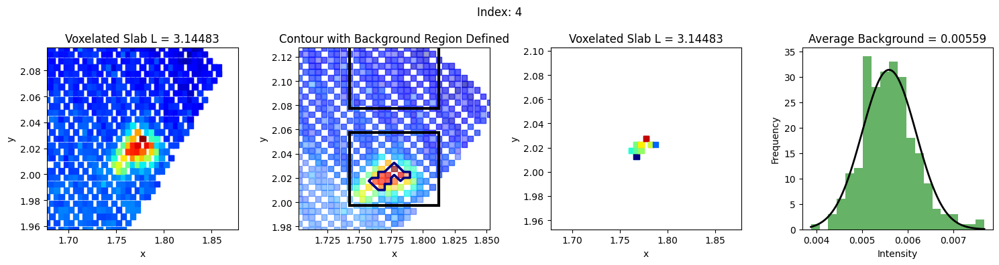

...

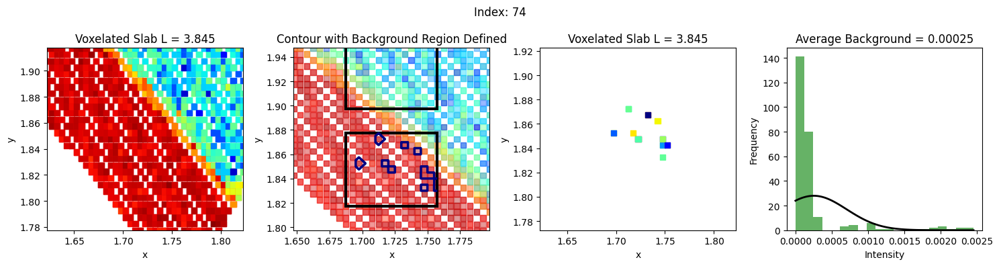

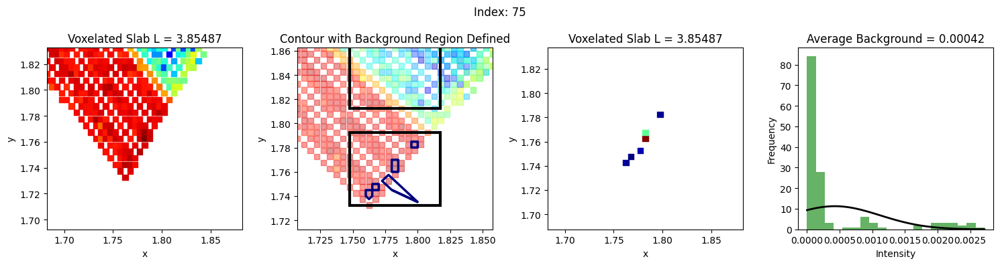

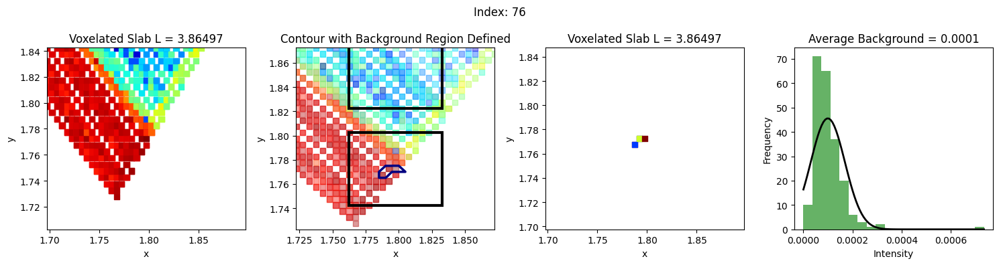

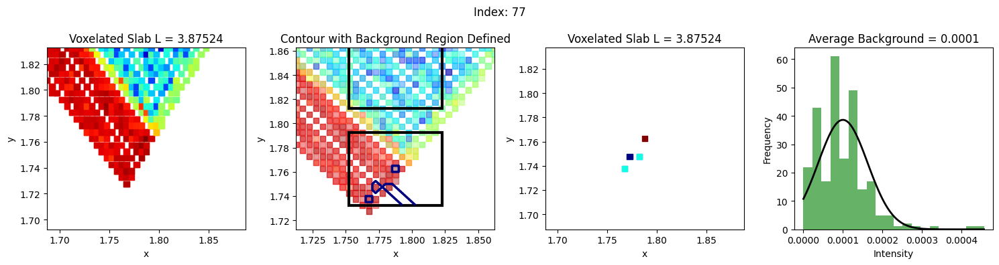

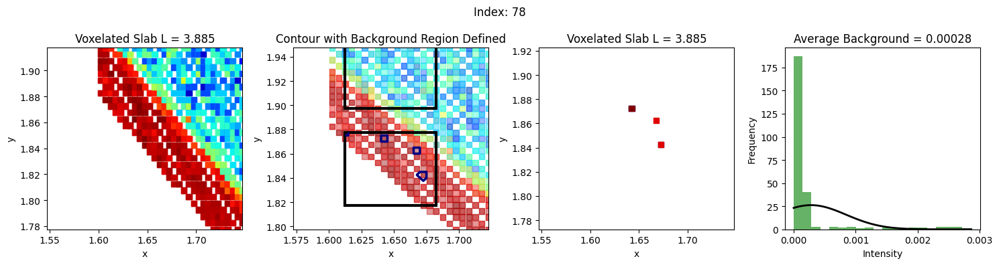

Congrats! You saved the 2D CTR in RLU


In [8]:
Ru1_P_200C_z_104, Ru1_P_200C_SF_104, Ru1_P_200C_SF_norm_104 = VoxInt_103_105(filename = '/10.15.2025_Ru1_Pristine_200C', sample = 'Ru1_Pristine', threshold = 92, l_min = 3.1, l_max = 3.9, cut_size = 0.01, bin_size = 20, plot = True, print3d = False, save2D = True)

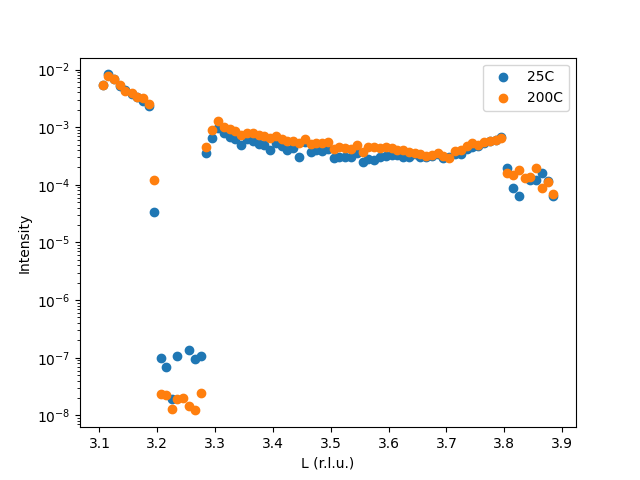

In [9]:
%matplotlib widget
plt.close('all')

plt.scatter(Ru1_P_25C_z_104, Ru1_P_25C_SF_norm_104, label = '25C')
plt.scatter(Ru1_P_200C_z_104, Ru1_P_200C_SF_norm_104, label = '200C')
# plt.ylim(bottom = 10**-2)
plt.legend()
plt.xlabel('L (r.l.u.)')
plt.ylabel('Intensity')
plt.yscale('log')